# <font style="color:blue">Faster RCNN Fine-tuning Experiment</font>

Train probe detector with Faster RCNN. 

---
![](https://www.researchgate.net/profile/Giang_Son_Tran/publication/324549019/figure/fig1/AS:649929152266241@1531966593689/Faster-R-CNN-Architecture-9.png)

---

We want to quickly fine-tune the Faster RCNN model to work for our detection problem.
The last layer (classifier) in the above image takes resized features of all proposed bounding boxes and predicts classes and bounding boxes. For this task, it uses FastRCNNPredictor network. So for fine-tuning with our data, we need to update the number of classes in the predictor. 

To get the Faster RCNN model with the number of classes, we can write the following method.

```
def faster_rcnn_pretrained_model(num_classes):
    # load an instance detection model pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    return model
```

Let's start training. We will use the trainer pipeline to train and evaluate our model. 


# <font style="color:blue">Experiment (Training)</font>

Let's write the experiment class for Fast RCNN fine-tuning.

In [24]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2

import os
import random
import cv2

from operator import itemgetter

import numpy as np
import torch
import torch.optim as optim
import matplotlib.pyplot as plt


from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import MultiStepLR

from trainer import Trainer, hooks, configuration
from trainer.utils import patch_configs
from trainer.utils import setup_system

from trainer.metrics import APEstimator
from trainer.datasets import ListDataset
from trainer.matplotlib_visualizer import MatplotlibVisualizer
# from trainer.utils import collate_fn

# from faster_rcnn_detector import faster_rcnn_pretrained_model

import warnings
warnings.filterwarnings('ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[autoreload of trainer.engine failed: Traceback (most recent call last):
  File "C:\Users\urial\anaconda3\lib\site-packages\IPython\extensions\autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "C:\Users\urial\anaconda3\lib\site-packages\IPython\extensions\autoreload.py", line 455, in superreload
    module = reload(module)
  File "C:\Users\urial\anaconda3\lib\importlib\__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 613, in _exec
  File "<frozen importlib._bootstrap_external>", line 846, in exec_module
  File "<frozen importlib._bootstrap_external>", line 983, in get_code
  File "<frozen importlib._bootstrap_external>", line 913, in source_to_code
  File "<frozen importlib._bootstrap>", line 228, in _call_with_frames_removed
  File "C:\Users\urial\BG\AlphaBravo\updated_process\experiments\rcnn\trainer\engine.py", line 7
    import .utils
           ^
SyntaxError: invalid syntax
]


In [9]:
from faster_rcnn_detector import faster_rcnn_pretrained_model

ModuleNotFoundError: No module named 'faster_rcnn_detector'

## <font style="color:green">1. Experiment Class</font>

In [10]:
class Experiment:
    def __init__(
        self,
        system_config: configuration.SystemConfig = configuration.SystemConfig(),
        dataset_config: configuration.DatasetConfig = configuration.DatasetConfig(),  
        dataloader_config: configuration.DataloaderConfig = configuration.DataloaderConfig(),
        optimizer_config: configuration.OptimizerConfig = configuration.OptimizerConfig(),
    ):
        self.system_config = system_config
        setup_system(system_config)
        
        # fruit detection data has 3-classes. Anything other than these three classes is called background
        self.classes = ['__background__', 'probe','kayak']
        
        # written custom dataset class of our dataset
        train_csv_path = os.path.join(dataset_config.root_dir, 'train_anno.csv')
        self.dataset_train = ListDataset(
            csv_path=train_csv_path,
            train = True,
            transform=None
        )

        self.loader_train = DataLoader(
            dataset=self.dataset_train,
            batch_size=dataloader_config.batch_size,
            shuffle=True,
            collate_fn=collate_fn,
            num_workers=0,#dataloader_config.num_workers,
            pin_memory=True
        )
        
        test_csv_path = os.path.join(dataset_config.root_dir, 'test_anno.csv')

        self.dataset_test = ListDataset(
            csv_path=test_csv_path,
            train=False,
            transform=None
        )
        self.loader_test = DataLoader(
            dataset=self.dataset_test,
            batch_size=dataloader_config.batch_size,
            shuffle=False,
            collate_fn=collate_fn,
            num_workers=0,#dataloader_config.num_workers,
            pin_memory=True
        )
        
        # get faster rcnn model pretrained on coco
        self.model = faster_rcnn_pretrained_model(len(self.classes))
        
        self.metric_fn = APEstimator(classes=self.classes)
        
        params = [p for p in self.model.parameters() if p.requires_grad]
        self.optimizer = optim.SGD(
            params,
            lr=optimizer_config.learning_rate,
            weight_decay=optimizer_config.weight_decay,
            momentum=optimizer_config.momentum
        )
        self.lr_scheduler = MultiStepLR(
            self.optimizer, milestones=optimizer_config.lr_step_milestones, gamma=optimizer_config.lr_gamma
        )
        self.visualizer = MatplotlibVisualizer()

    def run(self, trainer_config: configuration.TrainerConfig) -> dict:  
        setup_system(self.system_config)
        device = torch.device(trainer_config.device)
        self.model = self.model.to(device)

        model_trainer = Trainer(
            model=self.model,
            loader_train=self.loader_train,
            loader_test=self.loader_test,
            metric_fn=self.metric_fn,
            optimizer=self.optimizer,
            lr_scheduler=self.lr_scheduler,
            device=device,
            data_getter=itemgetter("image"),
            target_getter=itemgetter("target"),
            stage_progress=trainer_config.progress_bar,
            get_key_metric=itemgetter("mAP"),
            visualizer=self.visualizer,
            model_save_best=trainer_config.model_save_best,
            model_saving_frequency=trainer_config.model_saving_frequency,
            save_dir=trainer_config.model_dir
        )

        model_trainer.register_hook("train", hooks.train_hook_faster_rcnn)
        model_trainer.register_hook("test", hooks.test_hook_faster_rcnn)
        model_trainer.register_hook("end_epoch", hooks.end_epoch_hook_faster_rcnn)
        self.metrics = model_trainer.fit(trainer_config.epoch_num)
        return self.metrics

    def draw_bboxes(self, rows, columns, trainer_config: configuration.TrainerConfig):
        # load the best model
        if trainer_config.model_save_best:
            self.model.load_state_dict(
                torch.
                load(os.path.join(trainer_config.model_dir, self.model.__class__.__name__) + '_best.pth')
            )
        # or use the last saved
        self.model = self.model.eval()

        fig, ax = plt.subplots(
            nrows=rows, ncols=columns, figsize=(15, 30), gridspec_kw={
                'wspace': 0,
                'hspace': 0.05
            }
        )
        
        colors = [(255, 0, 0), (0, 225, 0), (0, 0, 225)]

        for axi in ax.flat:
            index = random.randrange(len(self.loader_test.dataset))

            image, targets = self.loader_test.dataset[index]

            device = torch.device(trainer_config.device)
            image = image.to(device).clone()

            detections = self.model(image.unsqueeze(0))
            bboxes = detections[0]['boxes'].cpu().detach().numpy()
            labels = detections[0]['labels'].cpu().detach().numpy()
            scores = detections[0]['scores'].cpu().detach().numpy()

            with torch.no_grad():
                img = image.cpu()
                img = img.numpy().transpose(1, 2, 0)
                img = (img * 255.).astype(np.uint8)
                gt_img = img.copy()
                pred_img = img.copy()

                for i, box in enumerate(targets['boxes']):
                    label = targets['labels'][i]
                    cls = self.classes[label]
                    clr = colors[label-1]
                    gt_img = cv2.rectangle(
                        gt_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
                    gt_img = cv2.putText(gt_img, cls, (int(box[0]), int(box[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 
                                         0.9, clr, 2)
                    
                for i, box in enumerate(bboxes):
                    label = labels[i]
                    score = scores[i]
                    cls = self.classes[label]
                    clr = colors[label-1]
                    cls_score = '{0}:{1:.2}'.format(cls, score)
                    pred_img = cv2.rectangle(
                        pred_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
                    pred_img = cv2.putText(pred_img, cls_score, (int(box[0]), int(box[1])-10), 
                                           cv2.FONT_HERSHEY_SIMPLEX, 0.9, clr, 2)

                merged_img = np.concatenate((gt_img, pred_img), axis=1)
                axi.imshow(merged_img)
                axi.axis('off')
        fig.show()

In [18]:
from torch.utils.data import Dataset
class ListDataset(Dataset):
    def __init__(self, root_dir, list_file, classes, mode, transform, input_size):
        '''
        Args:
          root_dir: (str) ditectory to images.
          list_file: (str) path to index file.
          train: (boolean) train or test.
          transform: ([transforms]) image transforms.
          input_size: (int) model input size.
        '''
        self.root_dir = root_dir
        self.classes = classes
        self.mode = mode
        self.transform = transform
        self.input_size = input_size

        self.fnames = []
        self.boxes = []
        self.labels = []

        list_file_path = os.path.join(root_dir, list_file)
        with open(list_file_path) as f:
            lines = f.readlines()
            self.num_samples = len(lines)

        for line in lines:
            splited = line.strip().split()
            self.fnames.append(splited[0])
            num_boxes = (len(splited) - 1) // 5
            box = []
            label = []
            for i in range(num_boxes):
                xmin = splited[1 + 5 * i]
                ymin = splited[2 + 5 * i]
                xmax = splited[3 + 5 * i]
                ymax = splited[4 + 5 * i]
                class_label = splited[5 + 5 * i]
                box.append([float(xmin), float(ymin), float(xmax), float(ymax)])
                label.append(int(class_label))
            self.boxes.append(torch.Tensor(box))
            self.labels.append(torch.LongTensor(label))

    def __getitem__(self, idx):
        '''Load image.

        Args:
          idx: (int) image index.

        Returns:
          img: (tensor) image tensor.
          loc_targets: (tensor) location targets.
          cls_targets: (tensor) class label targets.
        '''
        # Load image and boxes.
        path = os.path.join(self.root_dir, self.fnames[idx])
        img = cv2.imread(path)
        if img is None or np.prod(img.shape) == 0:
            print('cannot load image from path: ', path)
            sys.exit(-1)

        img = img[..., ::-1]

        boxes = self.boxes[idx].clone()
        labels = self.labels[idx]
        size = self.input_size

        # Resize & Flip
        img, boxes = resize(img, boxes, (size, size))
        if self.mode == 'train':
            img, boxes = random_flip(img, boxes)
        # Data augmentation.
        img = np.array(img)
        if self.transform:
            img = self.transform(image=img)['image']

        return img, boxes, labels

    def collate_fn(self, batch):
        '''Pad images and encode targets.

        As for images are of different sizes, we need to pad them to the same size.

        Args:F
          batch: (list) of images, cls_targets, loc_targets.

        Returns:
          padded images, stacked cls_targets, stacked loc_targets.
        '''
        imgs = [x[0] for x in batch]
        boxes = [x[1] for x in batch]
        labels = [x[2] for x in batch]

        h = w = self.input_size
        num_imgs = len(imgs)
        inputs = torch.zeros(num_imgs, 3, w, h)
        encoder = DataEncoder((w, h))
        loc_targets = []
        cls_targets = []
        for i in range(num_imgs):
            inputs[i] = imgs[i]
            loc_target, cls_target = encoder.encode(boxes[i], labels[i])
            loc_targets.append(loc_target)
            cls_targets.append(cls_target)
        return inputs, torch.stack(loc_targets), torch.stack(cls_targets)

    def __len__(self):
        return self.num_samples


## <font style="color:green">2. Dataset sanity check</font>

In [22]:
# written custom dataset class of our dataset
root_dir=r"C:\Users\urial\DS\opencv\probe\kayak"
csv_path = ('train_anno.csv')
# dataset_eval = ListDataset(root_dir=root_dir,list_file=csv_path,mode='train' ,transform=None)
dataset_eval = ListDataset(
            root_dir=r"C:\Users\urial\DS\opencv\probe\kayak",
            list_file='train_anno.csv',
            classes=["__background__", "probe",'kayak'],
            mode='train',
            transform=None,#Compose(dataset_config.train_transforms),
            input_size=300)

In [23]:
# Imports
import torch
import torch.nn as nn  # All neural network modules, nn.Linear, nn.Conv2d, BatchNorm, Loss functions
import torch.optim as optim  # For all Optimization algorithms, SGD, Adam, etc.
import torch.nn.functional as F  # All functions that don't have any parameters
from torch.utils.data import (
    DataLoader,
)  # Gives easier dataset managment and creates mini batches
import torchvision.datasets as datasets  # Has standard datasets we can import in a nice way
import torchvision.transforms as transforms  # Transformations we can perform on our dataset
# Load Data
# written custom dataset class of our dataset
root_dir=r"C:\Users\urial\DS\opencv\probe\kayak"
csv_path = os.path.join(root_dir, 'train_anno.csv')
dataset_eval = ListDataset(csv_path=csv_path,train = False,transform=None)
my_transforms = transforms.Compose(
    [  # Compose makes it possible to have many transforms
        transforms.Resize((36, 36)),  # Resizes (32,32) to (36,36)
        transforms.RandomCrop((32, 32)),  # Takes a random (32,32) crop
        transforms.ColorJitter(brightness=0.5),  # Change brightness of image
        transforms.RandomRotation(
            degrees=45
        ),  # Perhaps a random rotation from -45 to 45 degrees
        transforms.RandomHorizontalFlip(
            p=0.5
        ),  # Flips the image horizontally with probability 0.5
        transforms.RandomVerticalFlip(
            p=0.05
        ),  # Flips image vertically with probability 0.05
        transforms.RandomGrayscale(p=0.2),  # Converts to grayscale with probability 0.2
        transforms.ToTensor(),  # Finally converts PIL image to tensor so we can train w. pytorch
        transforms.Normalize(
            mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]
        ),  # Note: these values aren't optimal
    ]
)

TypeError: __init__() got an unexpected keyword argument 'csv_path'

In [6]:
for img,lable in dataset_eval:
    print(img.shape)

ValueError: too many values to unpack (expected 2)

## <font style="color:green">3. Run Experiment</font>

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


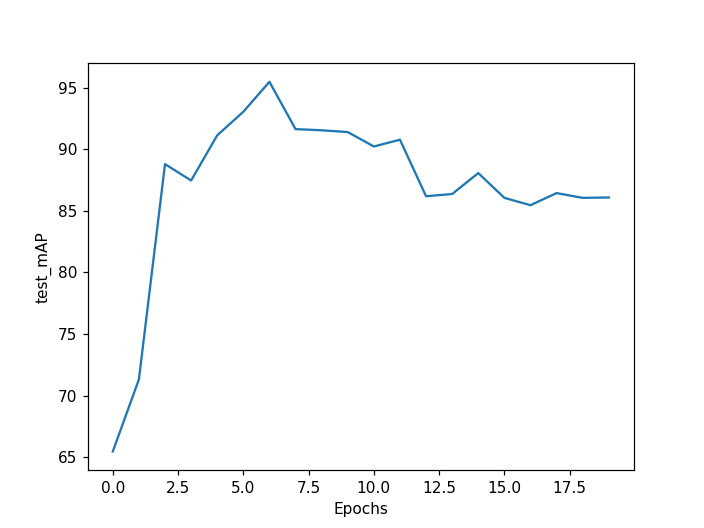

<IPython.core.display.Javascript object>


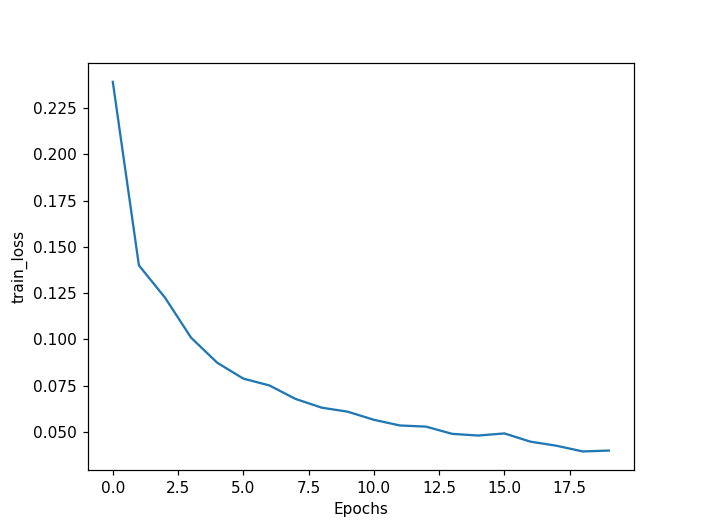

<IPython.core.display.Javascript object>


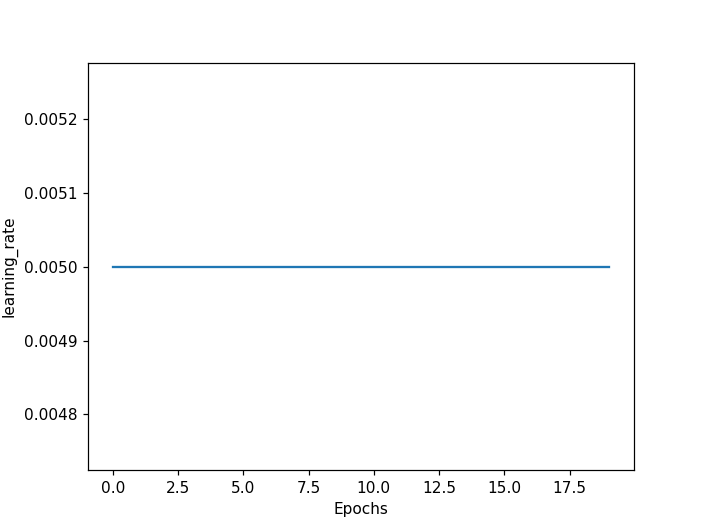

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [3]:
if __name__ == '__main__':
    dataloader_config, trainer_config = patch_configs(epoch_num_to_set=20, batch_size_to_set=8)

    dataset_config = configuration.DatasetConfig(
        root_dir=r"C:\Users\urial\DS\opencv\probe\probe",
    )
    
    optimizer_config = configuration.OptimizerConfig(
        learning_rate=5e-3, 
        lr_step_milestones=[50], 
        lr_gamma=0.1, 
        momentum=0.9, 
        weight_decay=1e-5
    )
    
    experiment = Experiment(
        dataset_config=dataset_config, 
        dataloader_config=dataloader_config, 
        optimizer_config=optimizer_config
    )
    
    # Run the experiment / start training
    experiment.run(trainer_config)

<IPython.core.display.Javascript object>


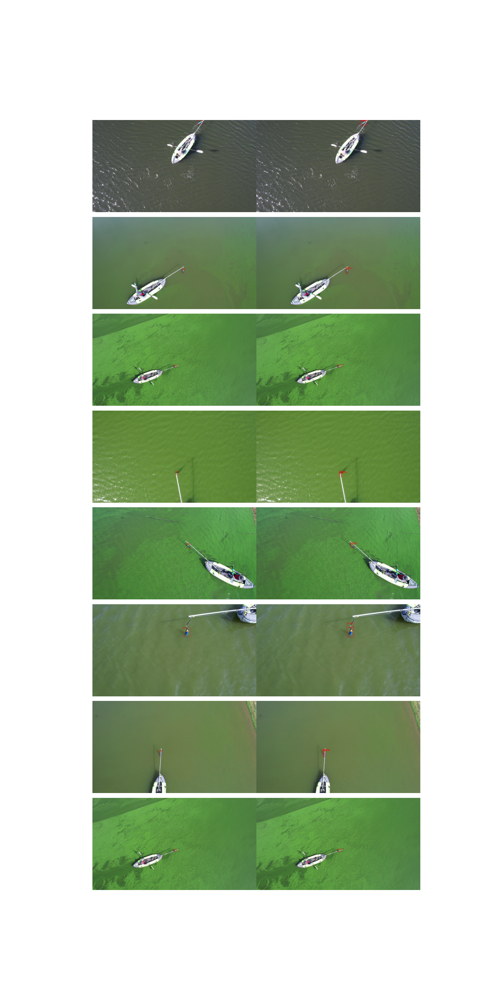

In [6]:
# how good our detector works by visualizing the results on the randomly chosen test images:

if __name__ == '__main__':
    experiment.draw_bboxes(8, 1, trainer_config)

In [15]:
from torchvision.models.detection import FasterRCNN,fasterrcnn_resnet50_fpn

In [16]:


# let number of classes 4 (including background)

ft_model = FasterRCNN(backbone=ft_backbone,
                      num_classes=3, 
                      min_size=ft_min_size, 
                      max_size=ft_max_size, 
                      image_mean=ft_mean, 
                      image_std=ft_std, 
                      rpn_anchor_generator=ft_anchor_generator, 
                      box_roi_pool=ft_roi_pooler)
ft_model = ft_model.to(device)

NameError: name 'ft_backbone' is not defined

In [ ]:
input_image1 = image1.clone()

input_image2 = image2.clone()

# input is image list
inputs = [input_image1.to(device), input_image2.to(device)]

ft_model.eval()
output = ft_model(inputs)

print(output)

In [20]:
PATH = r'C:\Users\urial\DS\faster_rcnn\fresh\models\last.pth'
torch.save(experiment.model.state_dict(), PATH)

In [29]:
state = torch.load(r'C:\Users\urial\DS\faster_rcnn\fresh\models\last.pth')
f = fasterrcnn_resnet50_fpn.load_state_dict(state)

AttributeError: 'function' object has no attribute 'load'

In [82]:
model = faster_rcnn_pretrained_model(2)

TypeError: faster_rcnn_pretrained_model() got an unexpected keyword argument 'rpn_score_thresh'

In [84]:
model.load_state_dict(torch.load(r'C:\Users\urial\DS\faster_rcnn\fresh\models\last.pth'))


<All keys matched successfully>

In [107]:
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [88]:
model(**kwargs)

TypeError: forward() got an unexpected keyword argument 'rpn_score_thresh'

In [63]:
import torch
import torchvision

from PIL import Image
import torchvision.transforms as T
img_path = r'C:\Users\urial\BG\AlphaBravo\samples_new\JPEGImages\5711_1637053937.jpg'
image1 = T.ToTensor()(Image.open(img_path))
img =  image1.clone()

from torchvision.models.detection import FasterRCNN,fasterrcnn_resnet50_fpn
model = faster_rcnn_pretrained_model(2)
model.load_state_dict(torch.load(r'C:\Users\urial\DS\faster_rcnn\fresh\models\last.pth'))
model.eval()


In [98]:
output = model([img])

print(output)

[{'boxes': tensor([[2227.2922363281, 1345.5053710938, 2497.9726562500, 1450.7526855469],
        [2297.5378417969, 1367.9296875000, 2563.4707031250, 1451.4819335938],
        [2326.0817871094, 1355.0104980469, 2471.1730957031, 1446.8704833984],
        [1902.0750732422,    0.0000000000, 1970.8044433594,   71.8318099976],
        [2501.6535644531, 1386.3995361328, 2573.2363281250, 1443.9249267578]],
       grad_fn=<StackBackward0>), 'labels': tensor([1, 1, 1, 1, 1]), 'scores': tensor([0.9620475173, 0.1022771224, 0.0869337097, 0.0824484602, 0.0781060457],
       grad_fn=<IndexBackward0>)}]


In [104]:
output[0]['boxes'][output[0]['scores'].argmax()]

tensor([2227.2922363281, 1345.5053710938, 2497.9726562500, 1450.7526855469],
       grad_fn=<SelectBackward0>)

In [105]:
detections[0]['scores'].argmax().cpu().detach().numpy()

array(0, dtype=int64)

In [80]:
defaults = {
 
        "rpn_score_thresh": 0.05,
    }

kwargs = {**defaults}
# return _fasterrcnn_mobilenet_v3_large_fpn(
#     weights=weights,
#     progress=progress,
#     num_classes=num_classes,
#     weights_backbone=weights_backbone,
#     trainable_backbone_layers=trainable_backbone_layers,
#     ,

In [145]:
detections[0]['scores'].argmax()

tensor(0)

In [161]:
len(detections[0]['scores'])


5

In [185]:
img =  image1.clone()
detections = model(img.unsqueeze(0))
min_val = detections[0]['scores'].argmax()

scores = detections[0]['scores'][min_val:min_val+1].cpu().detach().numpy()
bboxes = detections[0]['boxes'][min_val:min_val+1].cpu().detach().numpy()
labels = detections[0]['labels'][min_val:min_val+1].cpu().detach().numpy()
exp_cls = experiment.classes
# fig, ax = plt.subplots(
#     nrows=1, ncols=1, figsize=(15, 30), gridspec_kw={
#         'wspace': 0,
#         'hspace': 0.05
#     }
# )

with torch.no_grad():
    img = img.cpu()
    img = img.numpy().transpose(1, 2, 0)
    img = (img * 255.).astype(np.uint8)
    pred_img = img.copy()
    crop_img = img.copy()
#     for i, box in enumerate(targets['boxes']):
#         label = targets['labels'][i]
#         cls = self.classes[label]
#         clr = colors[label-1]
#         gt_img = cv2.rectangle(
#             gt_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
#         gt_img = cv2.putText(gt_img, cls, (int(box[0]), int(box[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 
#                              0.9, clr, 2)

    for i, box in enumerate(bboxes):
        label = labels[i]
        score = scores[i]
        cls = exp_cls[label]
        clr = colors[label-1]
        cls_score = '{0}:{1:.2}'.format(cls, score)
        pred_img = cv2.rectangle(
            pred_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
        pred_img = cv2.putText(pred_img, cls_score, (int(box[0]), int(box[1])-10), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.9, clr, 2)
        crop_img = new_boundry(bboxes,crop_img,out_size=1000)
#     merged_img = np.concatenate((gt_img, pred_img), axis=1)
plt.imshow(crop_img)
#     ax.axis('off')

In [170]:
# x1,y1,x2,y2
x1,y1,x2,y2 = bboxes[0]

In [175]:
x_mid = x1+((x2-x1)/2)
y_mid = y1+((y2-y1)/2)
print(x_mid,y_mid)

2362.6324462890625 1398.1290283203125


In [176]:
new_box = x_mid-400,y_mid-400,x_mid+400,y_mid+400

In [177]:
new_box

(1962.6324462890625, 998.1290283203125, 2762.6324462890625, 1798.1290283203125)

In [273]:
temp_box = (15,0,16,17)

In [277]:
tuple([1 if i<1 else i for i in temp_box ])

(15, 1, 16, 17)

In [272]:
all(temp_box)

False

In [180]:
def new_boundry(bboxes,img2crp,out_size=1000):
    x1,y1,x2,y2 = bboxes[0]
    x_mid = x1+((x2-x1)/2)
    y_mid = y1+((y2-y1)/2)
    out_size=out_size/2
    new_box = x_mid-out_size,y_mid-out_size,x_mid+out_size,y_mid+out_size
    cropped_img = img2crp[:][int(new_box[1]):int(new_box[3]),int(new_box[0]):int(new_box[2])].copy()
    return cropped_img

In [189]:
def new_boundry(bboxes,img2crp,out_size=1000):
    x1,y1,x2,y2 = bboxes[0]
    x_mid = x1+((x2-x1)/2)
    y_mid = y1+((y2-y1)/2)
    out_size=out_size/2
    new_box = x_mid-out_size,y_mid-out_size,x_mid+out_size,y_mid+out_size
    cropped_img = img2crp[:][int(new_box[1]):int(new_box[3]),int(new_box[0]):int(new_box[2])].copy()
    return cropped_img
Image.fromarray(crop_img).save(r'C:\Users\urial\DS\faster_rcnn\fresh\temp_outputs\temp.jpg')

In [179]:
new_boundry(bboxes,out_size=800)

(1962.6324462890625, 998.1290283203125, 2762.6324462890625, 1798.1290283203125)

In [166]:
bboxes

array([[2227.2922, 1345.5054, 2497.9727, 1450.7527]], dtype=float32)

<IPython.core.display.Javascript object>


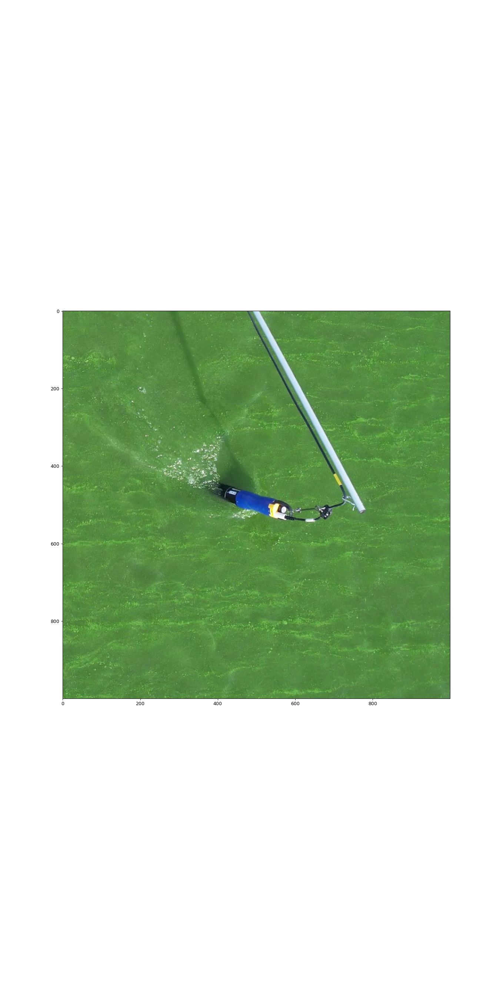

In [184]:
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(15, 30)
)
ax.imshow(crop_img)

<IPython.core.display.Javascript object>


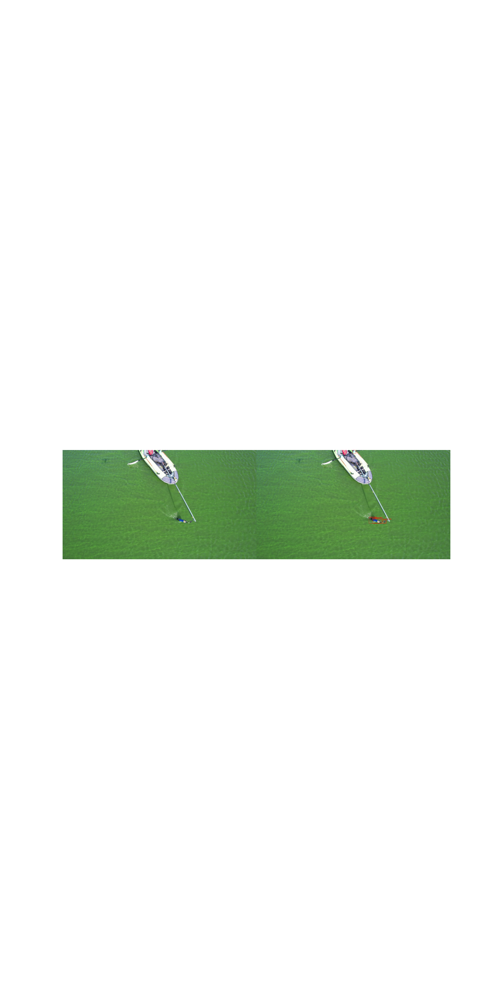

AttributeError: 'AxesSubplot' object has no attribute 'flat'

In [60]:
exp_cls = experiment.classes
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(15, 30), gridspec_kw={
        'wspace': 0,
        'hspace': 0.05
    }
)

colors = [(255, 0, 0), (0, 225, 0), (0, 0, 225)]

for axi in ax.flat:
    index = random.randrange(len(self.loader_test.dataset))

#     image, targets = self.loader_test.dataset[index]

#     device = torch.device(trainer_config.device)
#     image = image.to(device).clone()

    detections = model(img.unsqueeze(0))
    bboxes = detections[0]['boxes'].cpu().detach().numpy()
    labels = detections[0]['labels'].cpu().detach().numpy()
    scores = detections[0]['scores'].cpu().detach().numpy()

    with torch.no_grad():
        img = image.cpu()
        img = img.numpy().transpose(1, 2, 0)
        img = (img * 255.).astype(np.uint8)
        gt_img = img.copy()
        pred_img = img.copy()

#         for i, box in enumerate(targets['boxes']):
#             label = targets['labels'][i]
#             cls = self.classes[label]
#             clr = colors[label-1]
#             gt_img = cv2.rectangle(
#                 gt_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
#             gt_img = cv2.putText(gt_img, cls, (int(box[0]), int(box[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 
#                                  0.9, clr, 2)

        for i, box in enumerate(bboxes):
            label = labels[i]
            score = scores[i]
            cls = exp_cls[label]
            clr = colors[label-1]
            cls_score = '{0}:{1:.2}'.format(cls, score)
            pred_img = cv2.rectangle(
                pred_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
            pred_img = cv2.putText(pred_img, cls_score, (int(box[0]), int(box[1])-10), 
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.9, clr, 2)

        merged_img = np.concatenate((gt_img, pred_img), axis=1)
        axi.imshow(merged_img)
        axi.axis('off')
fig.show()

In [ ]:
    def draw_bboxes(self, rows, columns, trainer_config: configuration.TrainerConfig):
        # load the best model
        if trainer_config.model_save_best:
            self.model.load_state_dict(
                torch.
                load(os.path.join(trainer_config.model_dir, self.model.__class__.__name__) + '_best.pth')
            )
        # or use the last saved
        self.model = self.model.eval()

        fig, ax = plt.subplots(
            nrows=rows, ncols=columns, figsize=(15, 30), gridspec_kw={
                'wspace': 0,
                'hspace': 0.05
            }
        )
        
        colors = [(255, 0, 0), (0, 225, 0), (0, 0, 225)]

        for axi in ax.flat:
            index = random.randrange(len(self.loader_test.dataset))

            image, targets = self.loader_test.dataset[index]

            device = torch.device(trainer_config.device)
            image = image.to(device).clone()

            detections = self.model(image.unsqueeze(0))
            bboxes = detections[0]['boxes'].cpu().detach().numpy()
            labels = detections[0]['labels'].cpu().detach().numpy()
            scores = detections[0]['scores'].cpu().detach().numpy()

            with torch.no_grad():
                img = image.cpu()
                img = img.numpy().transpose(1, 2, 0)
                img = (img * 255.).astype(np.uint8)
                gt_img = img.copy()
                pred_img = img.copy()

                for i, box in enumerate(targets['boxes']):
                    label = targets['labels'][i]
                    cls = self.classes[label]
                    clr = colors[label-1]
                    gt_img = cv2.rectangle(
                        gt_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
                    gt_img = cv2.putText(gt_img, cls, (int(box[0]), int(box[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 
                                         0.9, clr, 2)
                    
                for i, box in enumerate(bboxes):
                    label = labels[i]
                    score = scores[i]
                    cls = self.classes[label]
                    clr = colors[label-1]
                    cls_score = '{0}:{1:.2}'.format(cls, score)
                    pred_img = cv2.rectangle(
                        pred_img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), clr, thickness=2)
                    pred_img = cv2.putText(pred_img, cls_score, (int(box[0]), int(box[1])-10), 
                                           cv2.FONT_HERSHEY_SIMPLEX, 0.9, clr, 2)

                merged_img = np.concatenate((gt_img, pred_img), axis=1)
                axi.imshow(merged_img)
                axi.axis('off')
        fig.show()

In [260]:
root = r'C:\Users\urial\DS\faster_rcnn\fresh\temp_outputs\JPEGImages'
inference_dataset = torchvision.datasets.ImageFolder(root)
inference_dataloader = DataLoader(
            dataset=inference_dataset,
            batch_size=1,
            shuffle=False,
            collate_fn=collate_fn,
            num_workers=0,#dataloader_config.num_workers,
            pin_memory=True )

In [283]:
inference_dataset[0].index

<function tuple.index(value, start=0, stop=9223372036854775807, /)>

0

In [231]:
index = random.randrange(len(inference_dataloader.dataset))

In [284]:
os.listdir(r'C:\Users\urial\DS\faster_rcnn\fresh\temp_outputs\small\inference')

['1_1638777534.jpg',
 '22_1637054330.jpg',
 '24_1638784793.jpg',
 '27_1638259683.jpg',
 '4_1637051811.jpg',
 '7_1637051520.jpg']

In [285]:
def find_pole(main_dir,out_dir):
    
    with torch.no_grad():
        all_imgs = os.listdir(main_dir)
        for img_name in all_imgs:
            img_path = os.path.join(main_dir,img_name)
            img1 = T.ToTensor()(Image.open(img_path))
            img =  img1.clone()
            detections = model(img.unsqueeze(0))

            if len(detections[0]['scores'])>0:
                img = img.cpu()
                img = img.numpy().transpose(1, 2, 0)
                img = (img * 255.).astype(np.uint8)
                crop_img = img.copy()
                min_val = detections[0]['scores'].argmax()

                scores = detections[0]['scores'][min_val:min_val+1].cpu().detach().numpy()
                bboxes = detections[0]['boxes'][min_val:min_val+1].cpu().detach().numpy()
                labels = detections[0]['labels'][min_val:min_val+1].cpu().detach().numpy()
                cropped_img = new_boundry(bboxes,crop_img)
                Image.fromarray(cropped_img).save(os.path.join(out_dir,img_name))
                print(f'{img_name} was saved')


In [287]:
find_pole(r'C:\Users\urial\DS\faster_rcnn\fresh\temp_outputs\JPEGImages\inference',r'C:\Users\urial\BG\AlphaBravo\updated_process\rcnn\out_idx')

1022_1637054363.jpg was saved
1024_1637053490.jpg was saved
1024_1638784826.jpg was saved
1029_1638785117.jpg was saved
1031_1638259716.jpg was saved
1033_1638260007.jpg was saved
1037_1637054072.jpg was saved
1040_1637053781.jpg was saved
1044_1637052515.jpg was saved
1049_1637052806.jpg was saved
1051_1638784165.jpg was saved
1054_1638783583.jpg was saved
1061_1638783874.jpg was saved
1064_1637052224.jpg was saved
1069_1637053097.jpg was saved
1078_1638777570.jpg was saved
1085_1637051556.jpg was saved
1086_1637051847.jpg was saved
108_1638259686.jpg was saved
1099_1638260010.jpg was saved
1101_1637053493.jpg was saved
1101_1638784829.jpg was saved
1103_1638785120.jpg was saved
1111_1638259719.jpg was saved
1113_1637053784.jpg was saved
1118_1637054075.jpg was saved
1126_1638784168.jpg was saved
1127_1637054366.jpg was saved
1129_1637052227.jpg was saved
1134_1637052518.jpg was saved
1135_1637052809.jpg was saved
1143_1638783586.jpg was saved
1146_1638783877.jpg was saved
1148_163705

2380_1638260052.jpg was saved
2380_1638784871.jpg was saved
2385_1637053535.jpg was saved
2387_1638783919.jpg was saved
238_1638783556.jpg was saved
2394_1638783628.jpg was saved
2399_1637051891.jpg was saved
2402_1637053142.jpg was saved
2405_1637052269.jpg was saved
2405_1637052851.jpg was saved
2408_1638777615.jpg was saved
240_1638784138.jpg was saved
2410_1637051601.jpg was saved
2410_1637052560.jpg was saved
2452_1638260055.jpg was saved
2454_1638784874.jpg was saved
2456_1637053538.jpg was saved
2457_1638259764.jpg was saved
245_1637053070.jpg was saved
245_1638783847.jpg was saved
2472_1637053829.jpg was saved
2474_1638783631.jpg was saved
2479_1637054120.jpg was saved
2480_1638783922.jpg was saved
2484_1637051894.jpg was saved
2498_1637052563.jpg was saved
24_1638784793.jpg was saved
2502_1637052272.jpg was saved
2505_1637051604.jpg was saved
2507_1637052854.jpg was saved
2507_1637053145.jpg was saved
250_1637051820.jpg was saved
2510_1638777618.jpg was saved
2545_1637053541.j

3834_1638783676.jpg was saved
3836_1637053190.jpg was saved
3839_1637052317.jpg was saved
3846_1637051649.jpg was saved
3847_1637052899.jpg was saved
3864_1638777663.jpg was saved
386_1638259695.jpg was saved
386_1638784805.jpg was saved
3896_1637054168.jpg was saved
389_1637053760.jpg was saved
3902_1637053877.jpg was saved
3905_1637053586.jpg was saved
3907_1638259812.jpg was saved
3909_1638260103.jpg was saved
3910_1638784922.jpg was saved
3912_1638783679.jpg was saved
3913_1637052320.jpg was saved
3922_1637051942.jpg was saved
3927_1638783970.jpg was saved
392_1637054051.jpg was saved
3931_1637053193.jpg was saved
3931_1638777666.jpg was saved
3935_1637052611.jpg was saved
3937_1637052902.jpg was saved
3943_1637051652.jpg was saved
395_1637053469.jpg was saved
3976_1637053589.jpg was saved
397_1637054342.jpg was saved
3991_1638259815.jpg was saved
3993_1637054171.jpg was saved
3993_1638784925.jpg was saved
39_1637054039.jpg was saved
4001_1638783682.jpg was saved
4005_1638260106.jp

533_1638777552.jpg was saved
5341_1638260151.jpg was saved
5343_1637053925.jpg was saved
5348_1637051990.jpg was saved
5348_1638259860.jpg was saved
5351_1637053634.jpg was saved
5354_1637052368.jpg was saved
5355_1638783727.jpg was saved
5355_1638784018.jpg was saved
536_1637051829.jpg was saved
5379_1637052659.jpg was saved
5381_1637052950.jpg was saved
5383_1638777714.jpg was saved
5402_1637051700.jpg was saved
5423_1637053928.jpg was saved
5426_1638784973.jpg was saved
5432_1637053637.jpg was saved
5441_1637054219.jpg was saved
5443_1638260154.jpg was saved
5450_1637052371.jpg was saved
5452_1638783730.jpg was saved
5457_1638784021.jpg was saved
5459_1637052662.jpg was saved
5463_1637051993.jpg was saved
5469_1637052953.jpg was saved
5476_1638777717.jpg was saved
5485_1637051703.jpg was saved
5507_1637053640.jpg was saved
5507_1638259866.jpg was saved
5520_1638260157.jpg was saved
5526_1637053931.jpg was saved
5533_1637051996.jpg was saved
5535_1637054222.jpg was saved
5536_1638784

6989_1637052713.jpg was saved
698_1637052212.jpg was saved
698_1638777558.jpg was saved
6999_1637051463.jpg was saved
699_1637052794.jpg was saved
69_1637052191.jpg was saved
7000_1637053004.jpg was saved
7004_1638777768.jpg was saved
7005_1637051754.jpg was saved
702_1637051544.jpg was saved
702_1637052503.jpg was saved
702_1638783862.jpg was saved
7034_1638260208.jpg was saved
7036_1637053691.jpg was saved
7036_1637053982.jpg was saved
7044_1637054273.jpg was saved
7049_1638259917.jpg was saved
7056_1638785027.jpg was saved
7066_1638783784.jpg was saved
706_1637053085.jpg was saved
7071_1638784075.jpg was saved
7078_1637052425.jpg was saved
7078_1637052716.jpg was saved
7079_1637053007.jpg was saved
7083_1638777771.jpg was saved
7087_1637051757.jpg was saved
7091_1637051466.jpg was saved
7120_1638259920.jpg was saved
7132_1638260211.jpg was saved
7138_1637054276.jpg was saved
7139_1637053694.jpg was saved
7146_1638783787.jpg was saved
7147_1638785030.jpg was saved
7151_1637052428.jpg

8522_1637051514.jpg was saved
8527_1637051805.jpg was saved
852_1637054357.jpg was saved
8533_1638777819.jpg was saved
853_1638784820.jpg was saved
8561_1637053742.jpg was saved
8564_1638260259.jpg was saved
8574_1638259968.jpg was saved
8578_1637054033.jpg was saved
8580_1638785078.jpg was saved
858_1637052218.jpg was saved
8591_1637054324.jpg was saved
8591_1638783835.jpg was saved
8604_1637053058.jpg was saved
8609_1638777822.jpg was saved
860_1638783577.jpg was saved
8610_1637052476.jpg was saved
8613_1637052767.jpg was saved
8613_1638784126.jpg was saved
8617_1637051808.jpg was saved
8623_1637051517.jpg was saved
8658_1638260262.jpg was saved
8666_1637054327.jpg was saved
8668_1637054036.jpg was saved
8671_1638259971.jpg was saved
8678_1637053745.jpg was saved
8678_1638785081.jpg was saved
8680_1638784129.jpg was saved
8685_1637053061.jpg was saved
868_1637052800.jpg was saved
8695_1637052479.jpg was saved
8697_1638783838.jpg was saved
8706_1638777825.jpg was saved
8708_1637052770

In [278]:
def new_boundry(bboxes,img2crp,out_size=1000):
    x1,y1,x2,y2 = bboxes[0]
    x_mid = x1+((x2-x1)/2)
    y_mid = y1+((y2-y1)/2)
    out_size=out_size/2
    new_box = x_mid-out_size,y_mid-out_size,x_mid+out_size,y_mid+out_size
    new_box = tuple([1 if i<1 else i for i in new_box])
    cropped_img = img2crp[:][int(new_box[1]):int(new_box[3]),int(new_box[0]):int(new_box[2])].copy()
    return cropped_img

with torch.no_grad():
    idx=0
    for inputs, labels in inference_dataloader:

        img1 = T.ToTensor()(inputs[0])
        img =  img1.clone()
        detections = model(img.unsqueeze(0))
        
        if len(detections[0]['scores'])>0:
            img = img.cpu()
            img = img.numpy().transpose(1, 2, 0)
            img = (img * 255.).astype(np.uint8)
            crop_img = img.copy()
            min_val = detections[0]['scores'].argmax()

            scores = detections[0]['scores'][min_val:min_val+1].cpu().detach().numpy()
            bboxes = detections[0]['boxes'][min_val:min_val+1].cpu().detach().numpy()
            labels = detections[0]['labels'][min_val:min_val+1].cpu().detach().numpy()
            cropped_img = new_boundry(bboxes,crop_img)
            Image.fromarray(cropped_img).save(fr'C:\Users\urial\BG\AlphaBravo\updated_process\rcnn\output\inference_{idx}.jpg')
            print(f'inference_{idx}.jpg was saved')
            idx+=1
#     inputs = inputs
#     print(inputs[0].)
#     output = model(inputs)
#     output = output.to(device)
#     index = output.data.numpy().argmax()
#     print index

inference_0.jpg was saved
inference_1.jpg was saved
inference_2.jpg was saved
inference_3.jpg was saved
inference_4.jpg was saved
inference_5.jpg was saved
inference_6.jpg was saved
inference_7.jpg was saved
inference_8.jpg was saved
inference_9.jpg was saved
inference_10.jpg was saved
inference_11.jpg was saved
inference_12.jpg was saved
inference_13.jpg was saved
inference_14.jpg was saved
inference_15.jpg was saved
inference_16.jpg was saved
inference_17.jpg was saved
inference_18.jpg was saved
inference_19.jpg was saved
inference_20.jpg was saved
inference_21.jpg was saved
inference_22.jpg was saved
inference_23.jpg was saved
inference_24.jpg was saved
inference_25.jpg was saved
inference_26.jpg was saved
inference_27.jpg was saved
inference_28.jpg was saved
inference_29.jpg was saved
inference_30.jpg was saved
inference_31.jpg was saved
inference_32.jpg was saved
inference_33.jpg was saved
inference_34.jpg was saved
inference_35.jpg was saved
inference_36.jpg was saved
inference_3

inference_297.jpg was saved
inference_298.jpg was saved
inference_299.jpg was saved
inference_300.jpg was saved
inference_301.jpg was saved
inference_302.jpg was saved
inference_303.jpg was saved
inference_304.jpg was saved
inference_305.jpg was saved
inference_306.jpg was saved
inference_307.jpg was saved
inference_308.jpg was saved
inference_309.jpg was saved
inference_310.jpg was saved
inference_311.jpg was saved
inference_312.jpg was saved
inference_313.jpg was saved
inference_314.jpg was saved
inference_315.jpg was saved
inference_316.jpg was saved
inference_317.jpg was saved
inference_318.jpg was saved
inference_319.jpg was saved
inference_320.jpg was saved
inference_321.jpg was saved
inference_322.jpg was saved
inference_323.jpg was saved
inference_324.jpg was saved
inference_325.jpg was saved
inference_326.jpg was saved
inference_327.jpg was saved
inference_328.jpg was saved
inference_329.jpg was saved
inference_330.jpg was saved
inference_331.jpg was saved
inference_332.jpg wa

inference_590.jpg was saved
inference_591.jpg was saved
inference_592.jpg was saved
inference_593.jpg was saved
inference_594.jpg was saved
inference_595.jpg was saved
inference_596.jpg was saved
inference_597.jpg was saved
inference_598.jpg was saved
inference_599.jpg was saved
inference_600.jpg was saved
inference_601.jpg was saved
inference_602.jpg was saved
inference_603.jpg was saved
inference_604.jpg was saved
inference_605.jpg was saved
inference_606.jpg was saved
inference_607.jpg was saved
inference_608.jpg was saved
inference_609.jpg was saved
inference_610.jpg was saved
inference_611.jpg was saved
inference_612.jpg was saved
inference_613.jpg was saved
inference_614.jpg was saved
inference_615.jpg was saved
inference_616.jpg was saved
inference_617.jpg was saved
inference_618.jpg was saved
inference_619.jpg was saved
inference_620.jpg was saved
inference_621.jpg was saved
inference_622.jpg was saved
inference_623.jpg was saved
inference_624.jpg was saved
inference_625.jpg wa

inference_883.jpg was saved
inference_884.jpg was saved
inference_885.jpg was saved
inference_886.jpg was saved
inference_887.jpg was saved
inference_888.jpg was saved
inference_889.jpg was saved
inference_890.jpg was saved
inference_891.jpg was saved
inference_892.jpg was saved
inference_893.jpg was saved
inference_894.jpg was saved
inference_895.jpg was saved
inference_896.jpg was saved
inference_897.jpg was saved
inference_898.jpg was saved
inference_899.jpg was saved
inference_900.jpg was saved
inference_901.jpg was saved
inference_902.jpg was saved
inference_903.jpg was saved
inference_904.jpg was saved
inference_905.jpg was saved
inference_906.jpg was saved
inference_907.jpg was saved
inference_908.jpg was saved
inference_909.jpg was saved
inference_910.jpg was saved
inference_911.jpg was saved
inference_912.jpg was saved
inference_913.jpg was saved
inference_914.jpg was saved
inference_915.jpg was saved
inference_916.jpg was saved
inference_917.jpg was saved
inference_918.jpg wa

inference_1170.jpg was saved
inference_1171.jpg was saved
inference_1172.jpg was saved
inference_1173.jpg was saved
inference_1174.jpg was saved
inference_1175.jpg was saved
inference_1176.jpg was saved
inference_1177.jpg was saved
inference_1178.jpg was saved
inference_1179.jpg was saved
inference_1180.jpg was saved
inference_1181.jpg was saved
inference_1182.jpg was saved
inference_1183.jpg was saved
inference_1184.jpg was saved
inference_1185.jpg was saved
inference_1186.jpg was saved
inference_1187.jpg was saved
inference_1188.jpg was saved
inference_1189.jpg was saved
inference_1190.jpg was saved
inference_1191.jpg was saved
inference_1192.jpg was saved
inference_1193.jpg was saved
inference_1194.jpg was saved
inference_1195.jpg was saved
inference_1196.jpg was saved
inference_1197.jpg was saved
inference_1198.jpg was saved
inference_1199.jpg was saved
inference_1200.jpg was saved
inference_1201.jpg was saved
inference_1202.jpg was saved
inference_1203.jpg was saved
inference_1204

In [233]:
for index in len(inference_dataloader.batch_sampler):
    

6

In [ ]:
for inputs, labels in dataloader['predict']:
    inputs = inputs.to(device)
    output = model(inputs)
    output = output.to(device)
    index = output.data.numpy().argmax()
    print index

In [ ]:
# or use the last saved
self.model = self.model.eval()

fig, ax = plt.subplots(
    nrows=rows, ncols=columns, figsize=(15, 30), gridspec_kw={
        'wspace': 0,
        'hspace': 0.05
    }
)

colors = [(255, 0, 0), (0, 225, 0), (0, 0, 225)]

for axi in ax.flat:
    index = random.randrange(len(self.loader_test.dataset))

    image, targets = self.loader_test.dataset[index]

    device = torch.device(trainer_config.device)
    image = image.to(device).clone()

In [205]:
sample_idx = torch.randint(len(loader_test), size=(1,)).item()
sample_idx

149

In [202]:
i = loader_test.batch_sampler

In [211]:
img = inference_dataset[149]

In [ ]:
data_transforms = {
    'predict': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    }

dataset = {'predict' : datasets.ImageFolder("./data", data_transforms['predict'])}
dataloader = {'predict': torch.utils.data.DataLoader(dataset['predict'], batch_size = 1, shuffle=False, num_workers=4)}

outputs = list()
since = time.time()
for inputs, labels in dataloader['predict']:
    inputs = inputs.to(device)
    output = model(inputs)
    output = output.to(device)
    index = output.data.numpy().argmax()
    print index

<IPython.core.display.Javascript object>


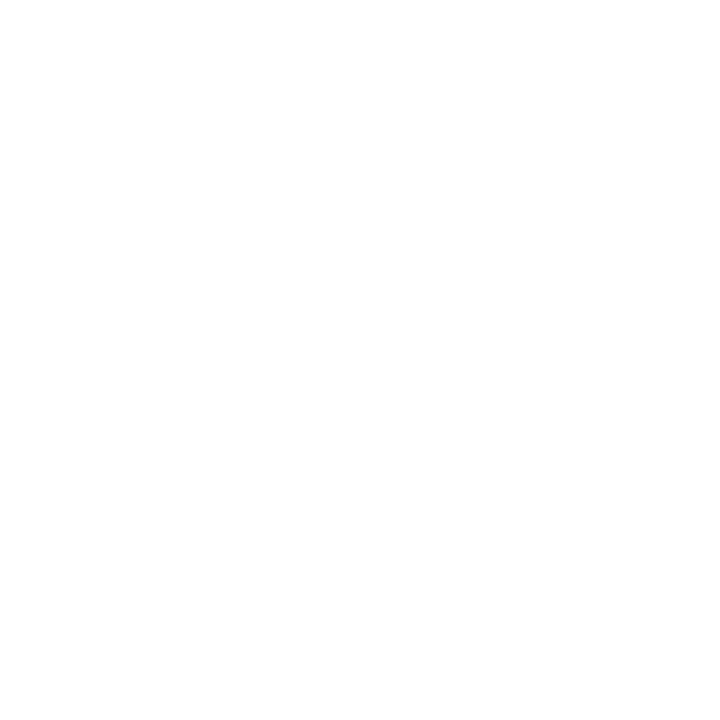

<IPython.core.display.Javascript object>


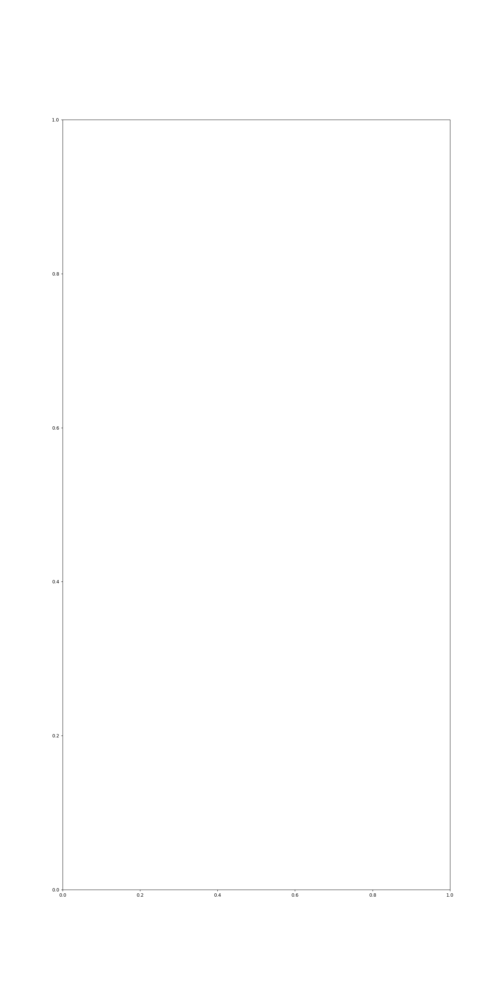

<IPython.core.display.Javascript object>


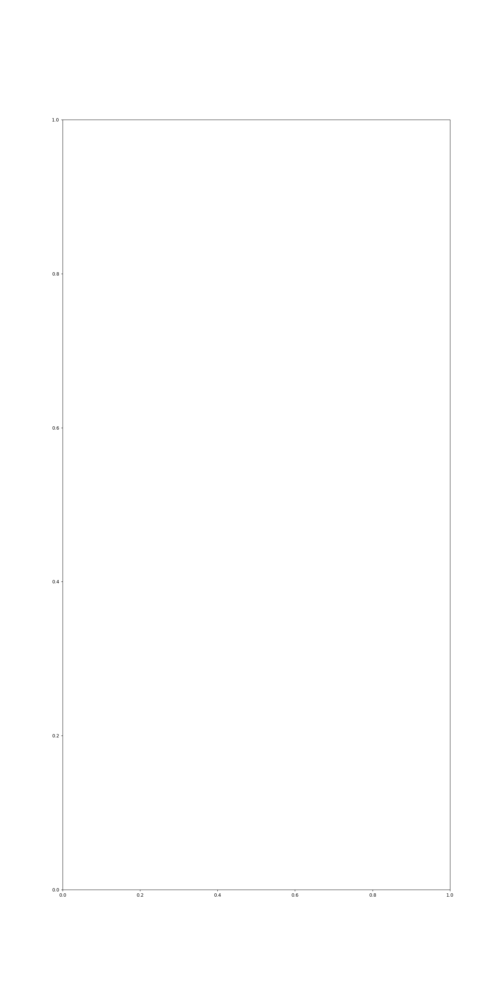

<IPython.core.display.Javascript object>


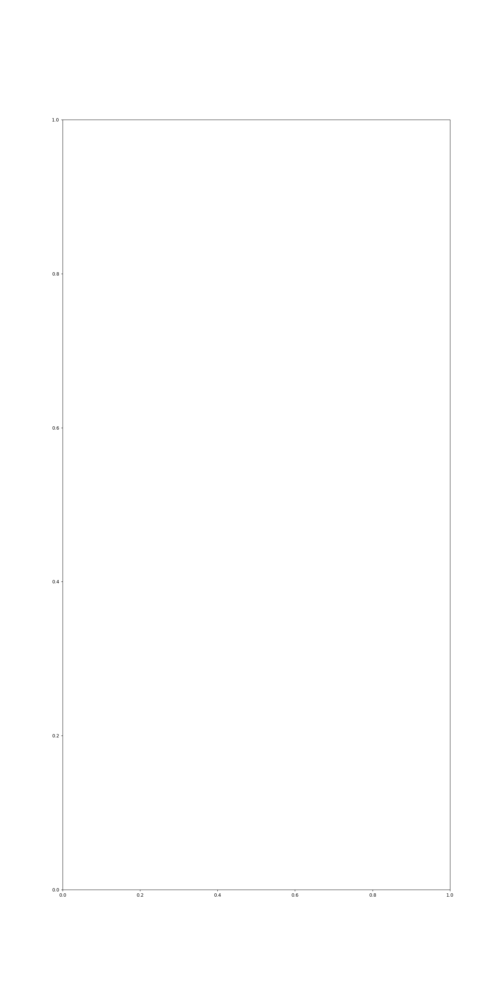

<IPython.core.display.Javascript object>


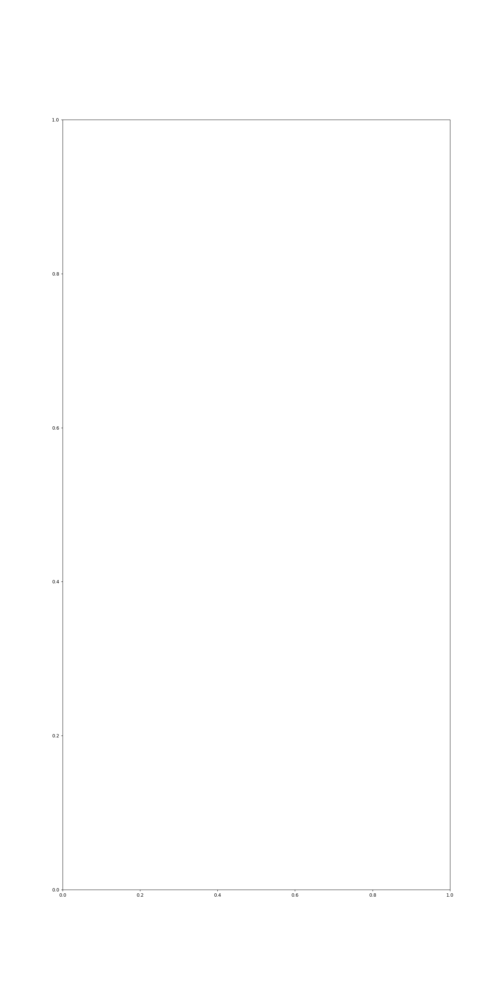

<IPython.core.display.Javascript object>


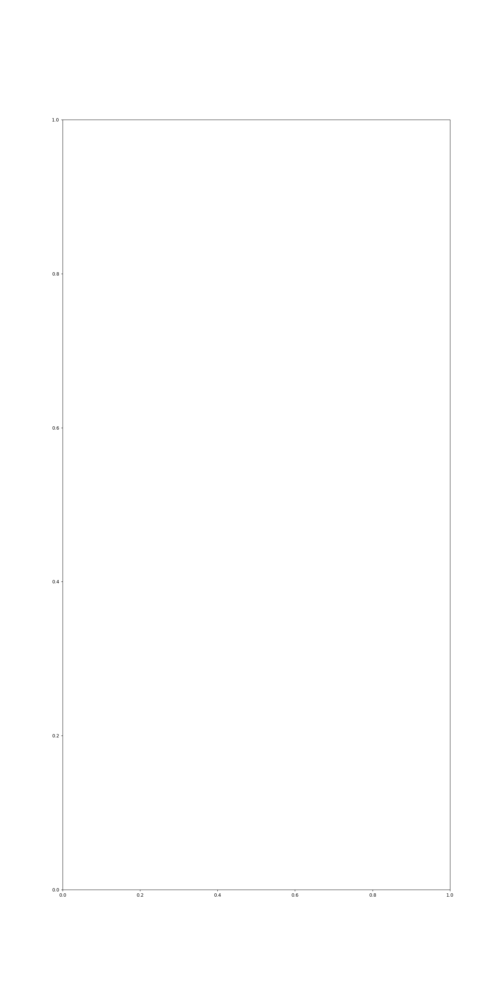

<IPython.core.display.Javascript object>


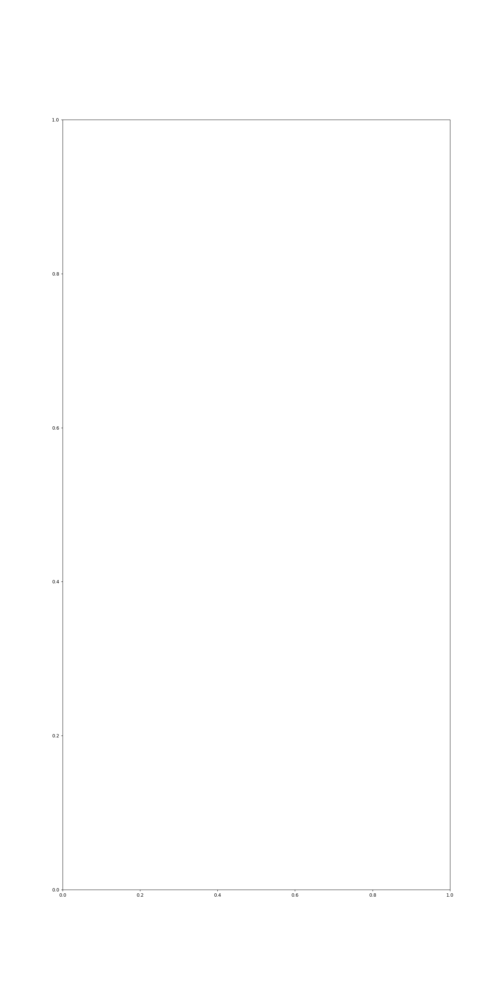

<IPython.core.display.Javascript object>


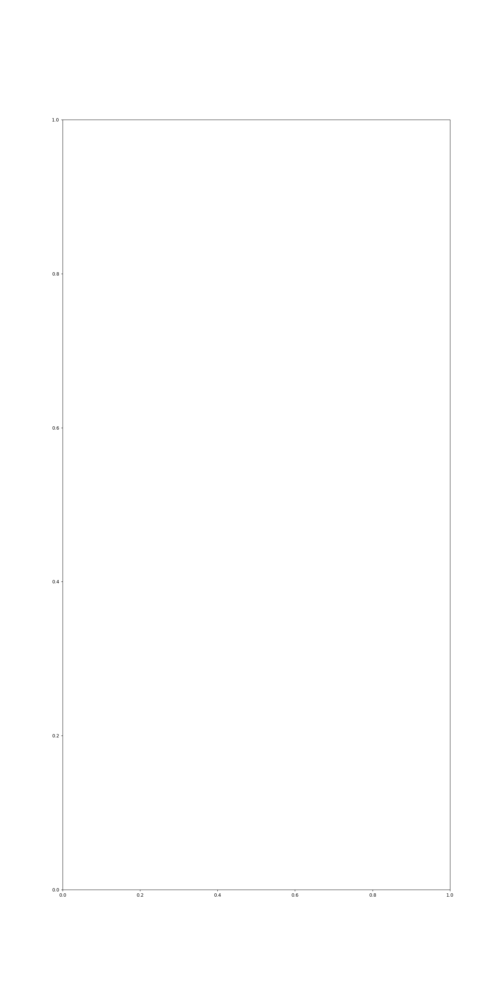

<IPython.core.display.Javascript object>


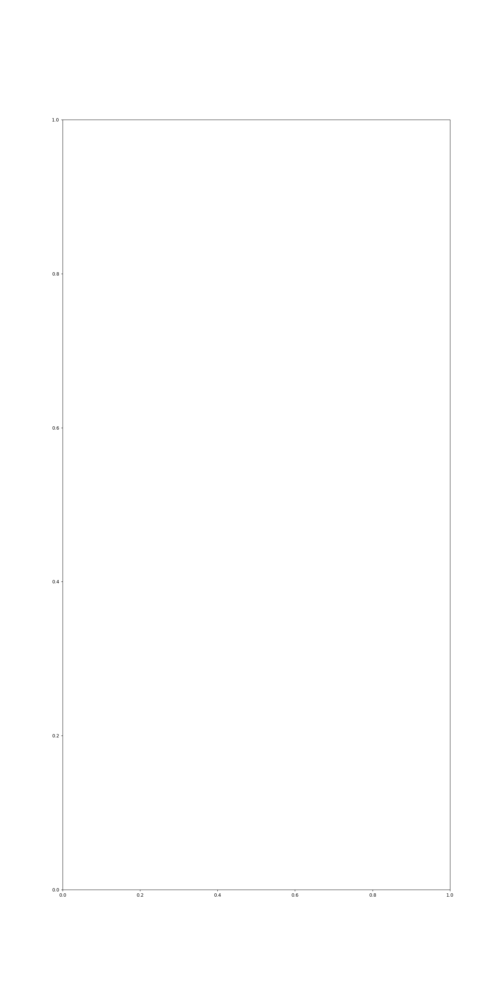

<IPython.core.display.Javascript object>


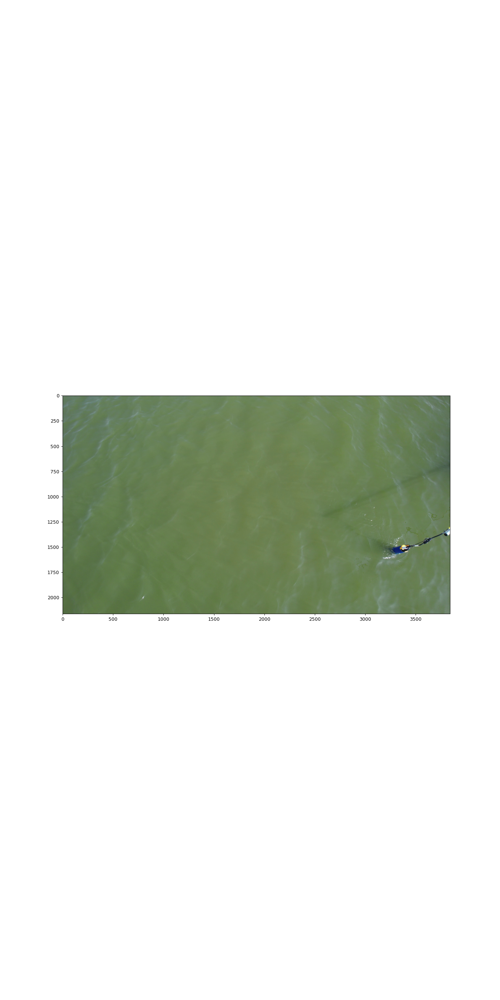

In [216]:
figure = plt.figure(figsize=(8, 8))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(inference_dataset), size=(1,)).item()
    img, label = inference_dataset[sample_idx]
#     figure.add_subplot(rows, cols, i)
#     plt.title(labels_map[label])
#     plt.axis("off")
#     plt.imshow(img.squeeze(), cmap="gray")
    fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(15, 30))
ax.imshow(img)
# plt.show()

In [220]:
train_features, train_labels = next(iter(inference_dataloader))

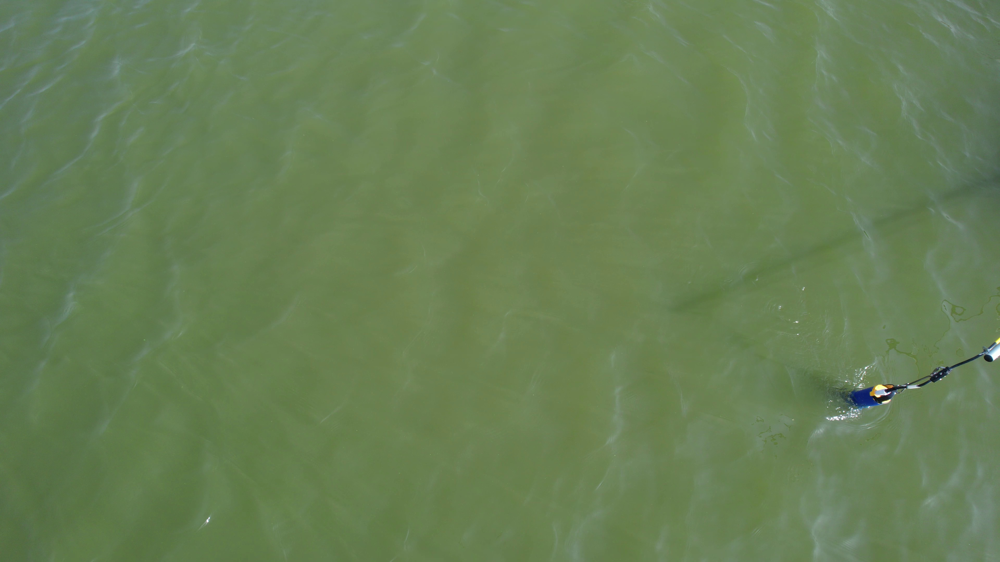

In [225]:
train_features[0]

In [226]:
# Display image and label.
train_features, train_labels = next(iter(inference_dataloader))
print(f"Feature batch shape: {len(train_features)}")
print(f"Labels batch shape: {len(train_labels)}")
img = train_features[0]
label = train_labels[0]
plt.imshow(img, cmap="gray")
plt.show()
print(f"Label: {label}")

Feature batch shape: 8
Labels batch shape: 8
Label: 0


In [ ]:
from torch.utils.data import DataLoader

DataLoader(
    dataset,
    batch_size=8,
    shuffle=False,
    num_workers=0,
    collate_fn=None,
    pin_memory=False,
 )

In [ ]:
        self.dataset_test = ListDataset(
            csv_path=test_csv_path,
            train=False,
            transform=None
        )
        self.loader_test = DataLoader(
            dataset=self.dataset_test,
            batch_size=dataloader_config.batch_size,
            shuffle=False,
            collate_fn=collate_fn,
            num_workers=0,#dataloader_config.num_workers,
            pin_memory=True
        )